# Regularizing DG1 bias


In [1]:
# Preamble, notebook setup and imports

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%config Completer.use_jedi = False

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [15]:
from src.config import load_default_chrom_configs

config1, _ = load_default_chrom_configs('distinct')


todo: Loading testing config from replication deconvolution


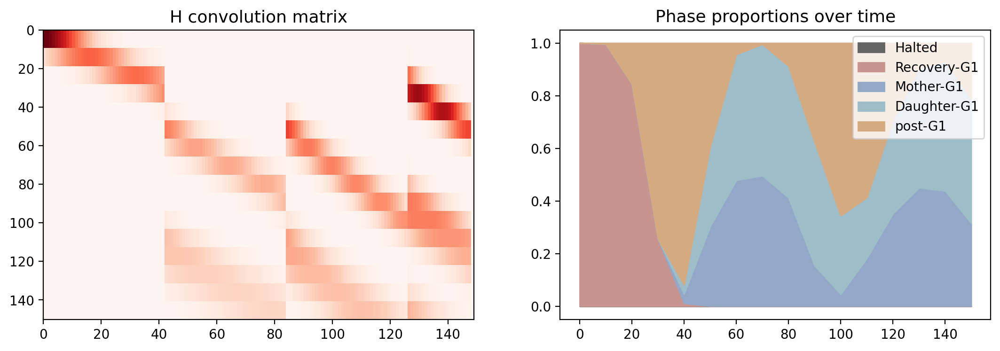

Text(0.5, 1.0, 'Mass of cells in G1')

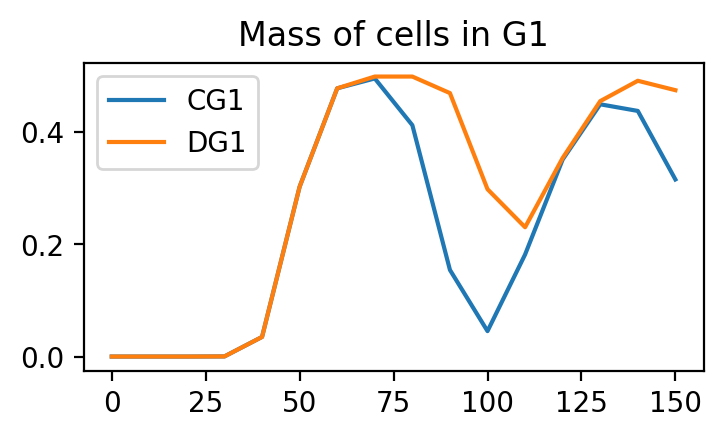

In [16]:
config1.plot_H()
c_indices = config1.get_Hpositions_for_phase('CG1')
d_indices = config1.get_Hpositions_for_phase('DG1')
plt.show()

plt.figure(figsize=(4, 2))
plt.plot(config1.timepoints, config1.H[:, c_indices].sum(axis=1), label="CG1")
plt.plot(config1.timepoints, config1.H[:, d_indices].sum(axis=1), label="DG1")
plt.legend()
plt.title("Mass of cells in G1")


In [760]:
from src.chromatin_model import ChromatinModel
from src.sgd import get_orfname
from src.sgd import read_nondubious_genes_dataset
from src.chromatin_deconvolution_solver import dummy_N_frep_b, \
    subset_select_highest_G_indices
from src.chromatin_deconvolution_solver import ChromatinDeconvolveSolver


genes = read_nondubious_genes_dataset()

def load_solver_gene(gene_name, subset=True, window=200):
    orfname = get_orfname(gene_name)

    gene = genes.loc[orfname]
    tss = gene.TSS
    chrom = gene.chr
    return load_solver_region(chrom, tss, subset=subset, window=window)
    
def load_solver_region(chrom, mid, subset=True, window=200):
    win_2 = window//2
    
    mnase_span = mid-win_2, mid+win_2

    chromatin_model = ChromatinModel(config1)
    chromatin_model.load_mnase_span(chrom=chrom, mnase_span=mnase_span)

    N, frep, b = dummy_N_frep_b(config1)
    
    if subset:
        G_values, highest_Gs = subset_select_highest_G_indices(chromatin_model.G)
    else:
        G_values = chromatin_model.G

    chromatin_solver = ChromatinDeconvolveSolver(config1, G_values, N, b, frep)
    chromatin_solver.chromatin_model = chromatin_model
    return chromatin_solver


In [310]:
from src.chromatin_deconvolution_solver import plot_example_fits

In [695]:
from src.dg1_bias_regularization import plot_kappas_for_fits

# Create a plot to compare the bias correction modes

# For a single gene and gamma value
# We'll sweep kappa values for a small set of chromatin curves
# to show how the bias correction function grows with respect to kappa

def compute_Fs_and_plot_bias_mode(chromatin_solver, bias_mode,
                                 kappas=None):
    
    if kappas is None:
        num_kappas = 20
        k_min, k_max = 1e-4, 1
        logks = np.linspace(np.log10(k_min), np.log10(k_max), num_kappas)
        kappas = 10**logks

    F_kappas = []
    for i, kappa in enumerate(kappas):
        F_kappa = chromatin_solver.deconvolve_G_iteratively(gamma=0.0076, kappa=kappa,
                                                              dg1_bias_mode=bias_mode,
                                                           verbose=False)
        F_kappas.append(F_kappa)
    F_kappa_arr = np.stack(F_kappas)
    fig = plot_kappas_for_fits(chromatin_solver.config, 
        F_kappa_arr, chromatin_solver.G, kappa_values=kappas)
    plt.suptitle(f"DG1 bias mode: {bias_mode}")

    return chromatin_solver, F_kappa_arr


In [788]:
chromatin_solver = load_solver_gene('MCM6')

Loading chromosome reads: 7
Applying a normalization for length distribution


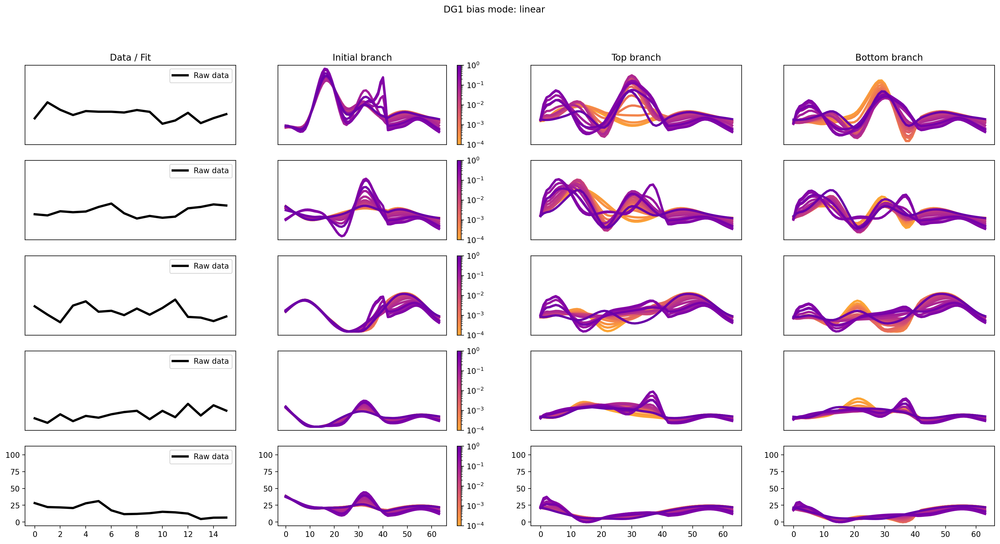

In [699]:
chromatin_solver, F_kappa_arr = compute_Fs_and_plot_bias_mode(chromatin_solver, 'linear')

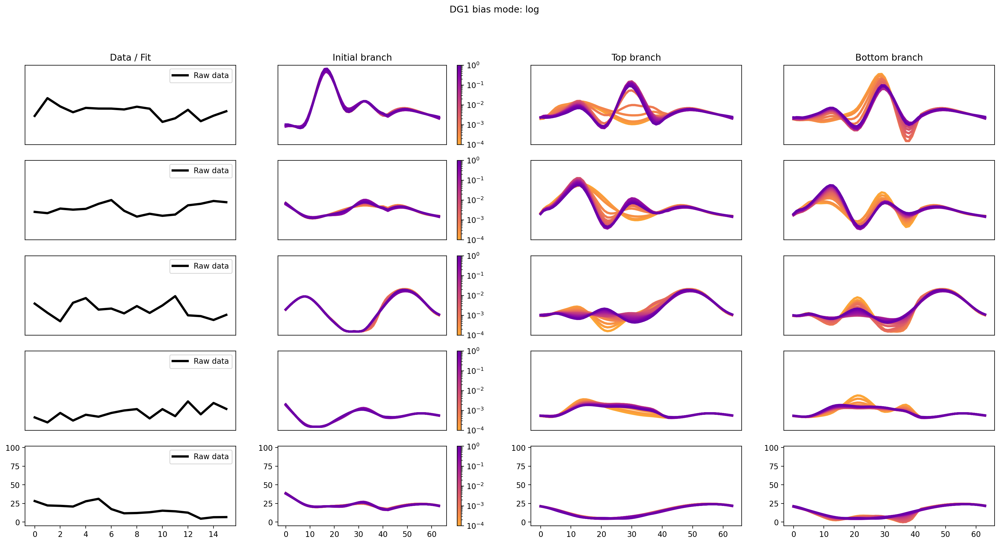

In [697]:
chromatin_solver, F_kappa_arr = compute_Fs_and_plot_bias_mode(chromatin_solver, 'log')

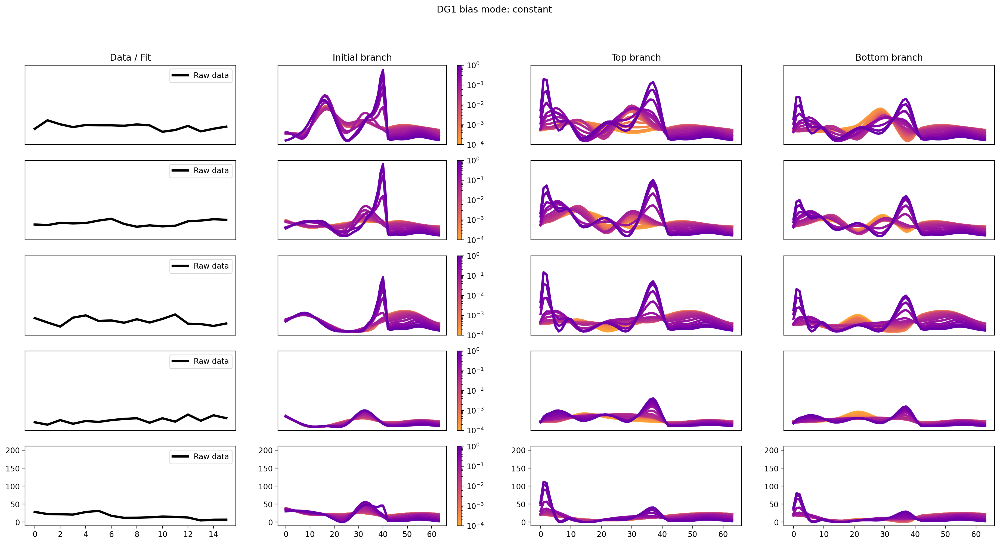

In [789]:
_ = compute_Fs_and_plot_bias_mode(chromatin_solver, 'constant')

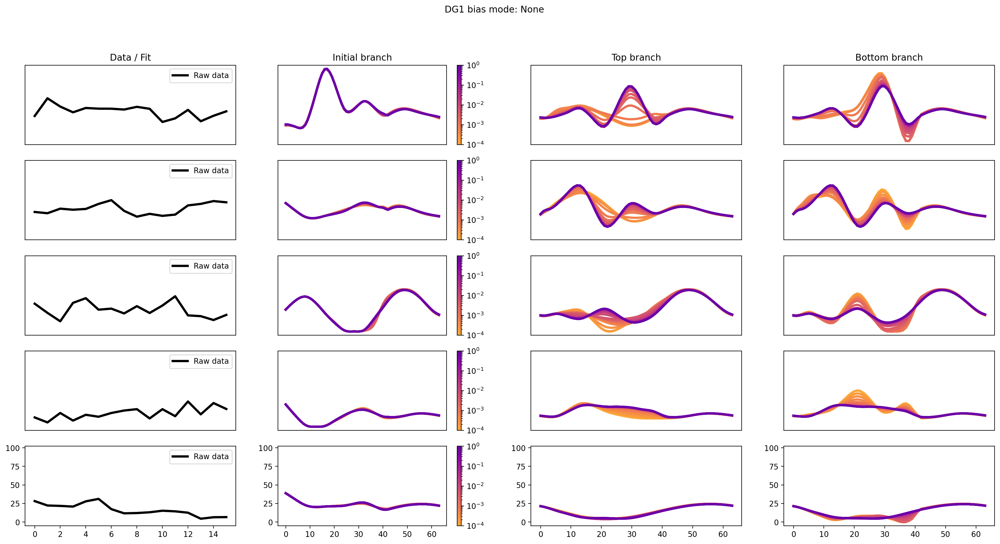

In [698]:
chromatin_solver, F_kappa_arr = compute_Fs_and_plot_bias_mode(chromatin_solver, None)

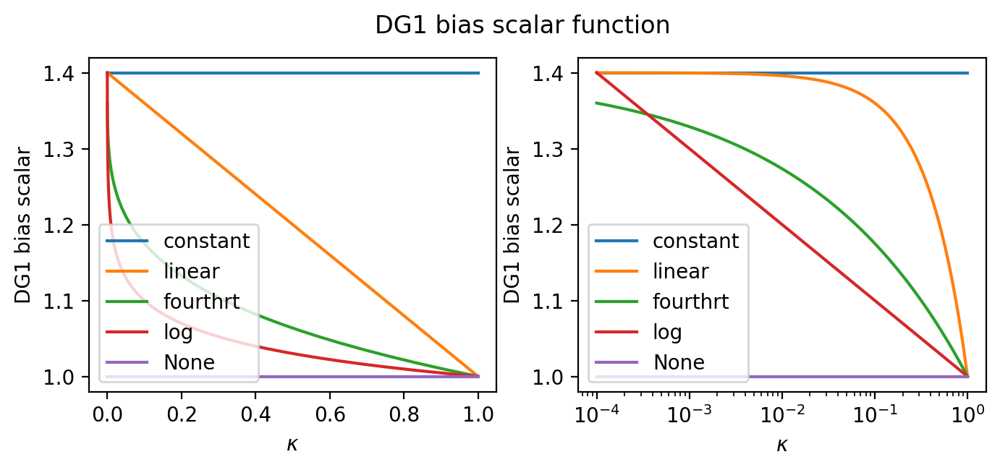

In [820]:
from src.dg1_bias_regularization import plot_phi_curves_comparison, get_dg1_bias_scale

plot_phi_curves_comparison()

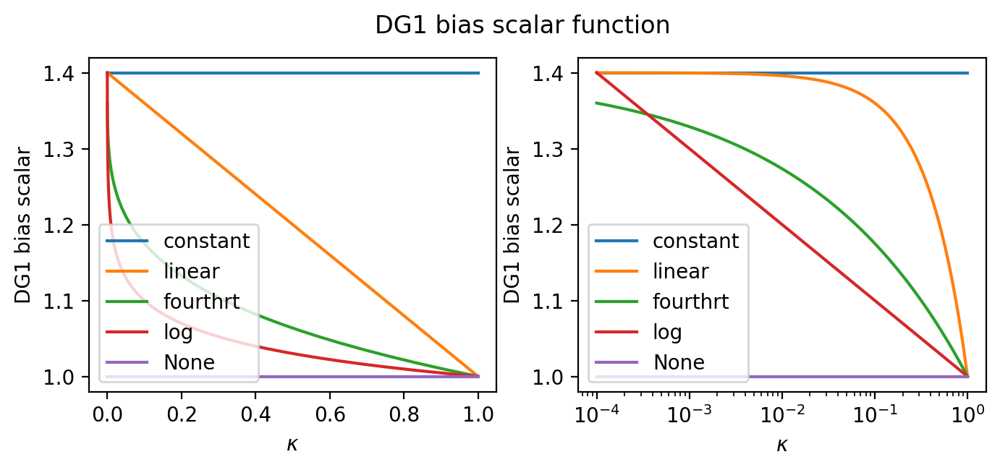

In [700]:
from src.dg1_bias_regularization import plot_phi_curves_comparison, get_dg1_bias_scale

plot_phi_curves_comparison()

In [702]:
# Now let's look at some examples where the reads should be relatively fixed. As in the 
# intergenic regions. We can plot the chromatin with and without bias correction.

In [859]:
kappa = 0.001
gamma = 0.0076
window = 1000

chromatin_solver_hm = load_solver_region(4, 620908, subset=False, window=window)

Loading chromosome reads: 4
Applying a normalization for length distribution


0/2600 - 00:00:00.001
500/2600 - 00:00:04.245
1000/2600 - 00:00:48.488
1500/2600 - 00:01:40.586
2000/2600 - 00:02:35.308
2500/2600 - 00:03:22.877
Completed - 00:03:26.708


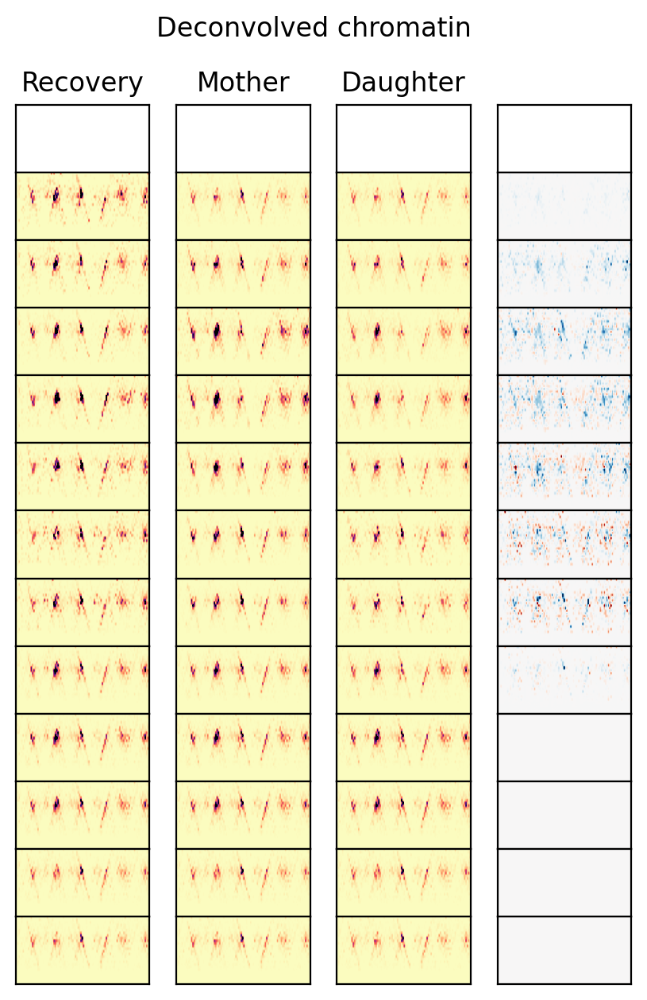

In [860]:
from src.chromatin_deconvolution_solver import plot_branches

F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='linear',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.001
500/2600 - 00:00:04.050
1000/2600 - 00:00:47.240
1500/2600 - 00:01:41.417
2000/2600 - 00:02:48.350
2500/2600 - 00:03:39.663
Completed - 00:03:43.658


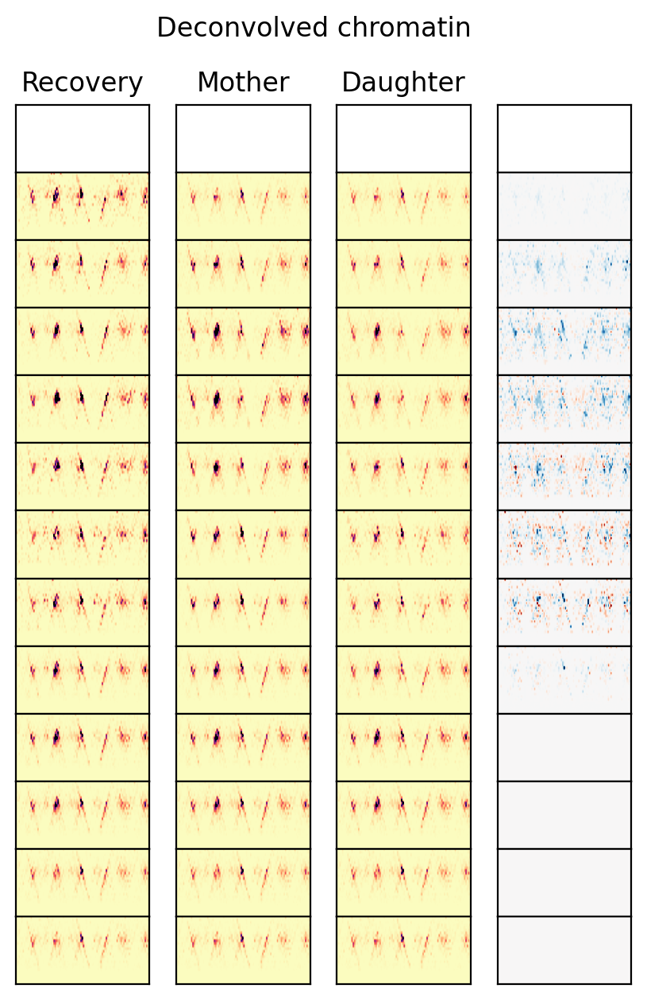

In [861]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='constant',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.025
500/2600 - 00:00:05.222
1000/2600 - 00:00:49.177
1500/2600 - 00:01:34.932
2000/2600 - 00:02:30.646
2500/2600 - 00:03:19.509
Completed - 00:03:23.799


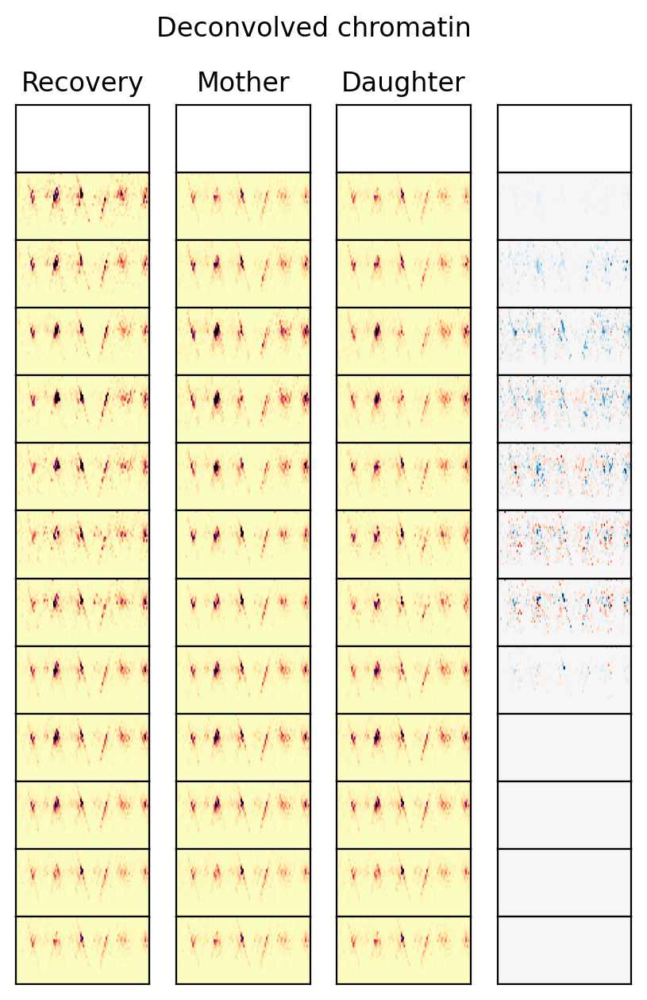

In [862]:
from src.chromatin_deconvolution_solver import plot_branches

F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='log',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

In [863]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='None',
                                                   verbose=True)

0/2600 - 00:00:00.000
500/2600 - 00:00:05.052
1000/2600 - 00:01:01.831
1500/2600 - 00:02:07.281
2000/2600 - 00:03:10.676
2500/2600 - 00:04:00.787
Completed - 00:04:04.939


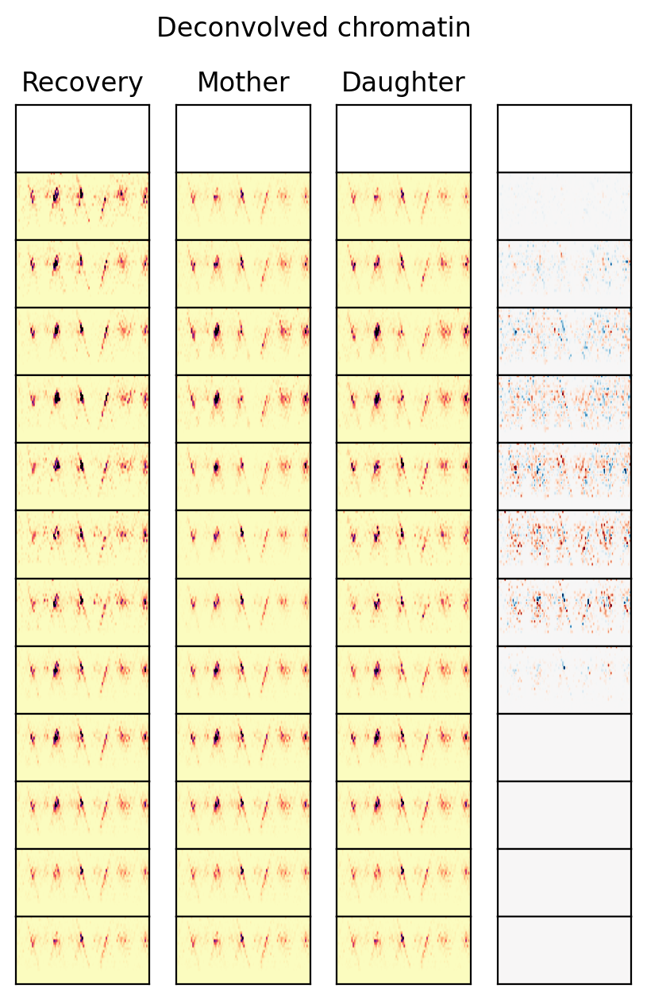

In [864]:
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

In [865]:
chromatin_solver_hm = load_solver_gene('DSE1', subset=False, window=window)

Loading chromosome reads: 5
Applying a normalization for length distribution


0/2600 - 00:00:00.013
500/2600 - 00:00:04.359
1000/2600 - 00:00:45.116
1500/2600 - 00:01:30.578
2000/2600 - 00:02:17.562
2500/2600 - 00:03:09.720
Completed - 00:03:12.755


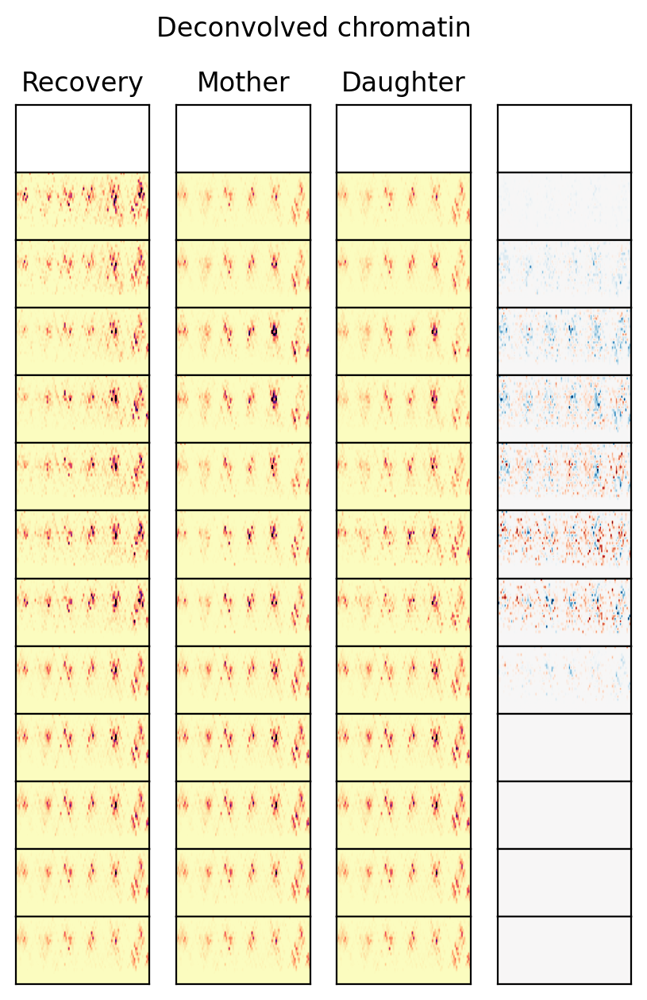

In [866]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='log',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.001
500/2600 - 00:00:04.268
1000/2600 - 00:00:59.550
1500/2600 - 00:01:50.130
2000/2600 - 00:02:44.021
2500/2600 - 00:03:35.202
Completed - 00:03:38.055


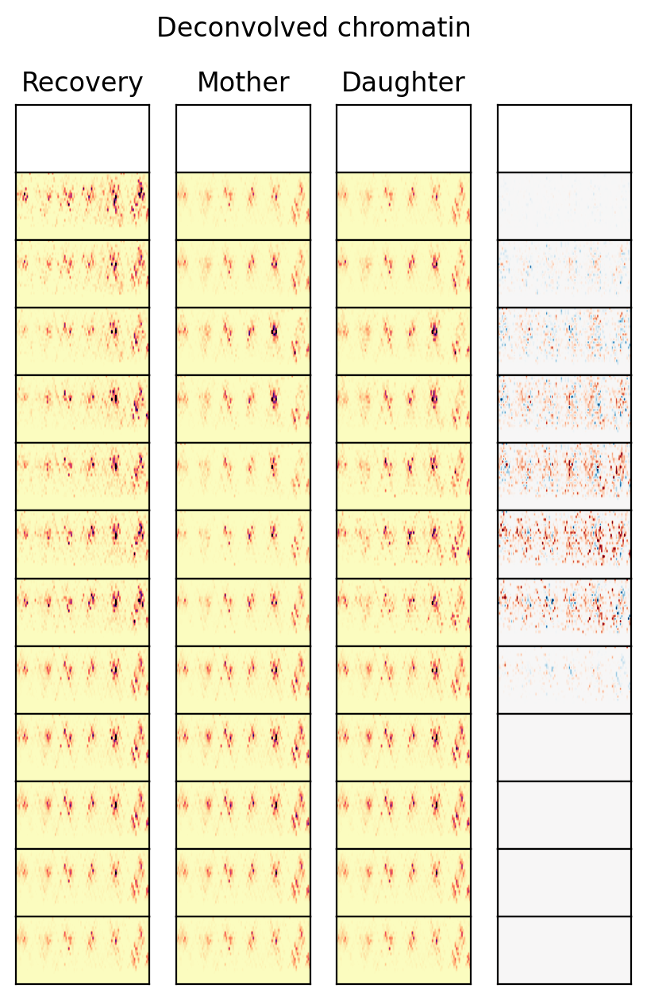

In [867]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='None',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.000
500/2600 - 00:00:04.957
1000/2600 - 00:01:00.668
1500/2600 - 00:01:57.019
2000/2600 - 00:02:51.012
2500/2600 - 00:03:42.113
Completed - 00:03:45.149


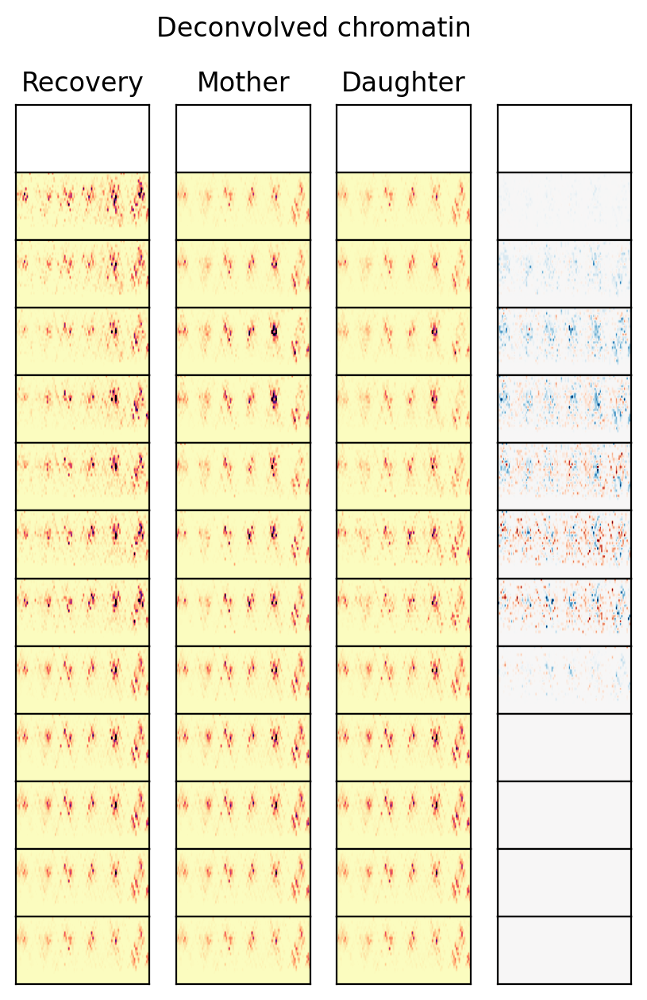

In [868]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='constant',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.001
500/2600 - 00:00:04.724
1000/2600 - 00:00:56.609
1500/2600 - 00:01:55.540
2000/2600 - 00:02:44.332
2500/2600 - 00:03:27.083
Completed - 00:03:29.741


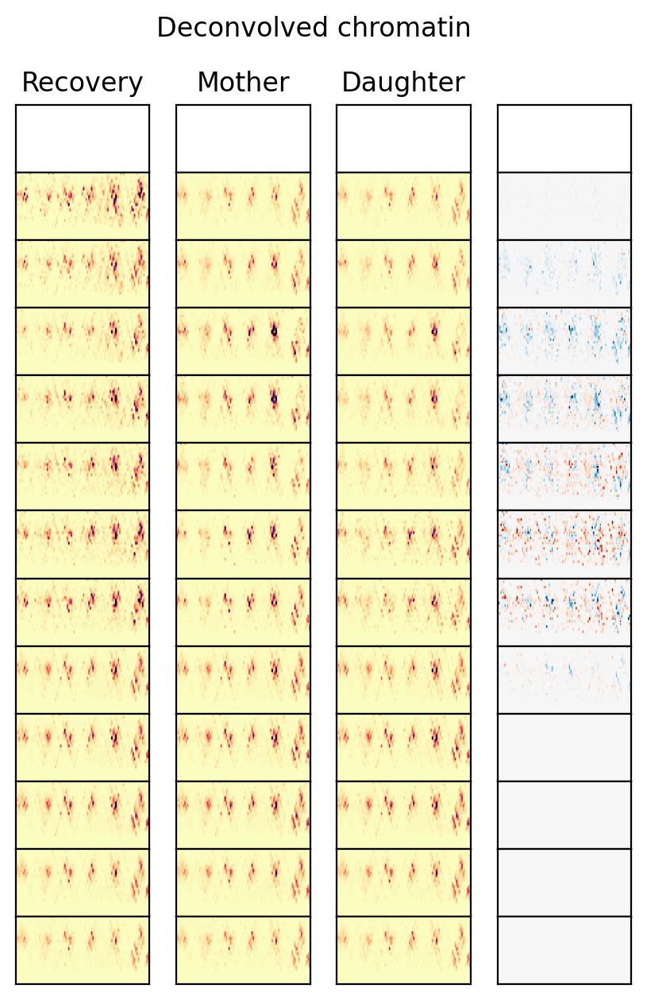

In [869]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='linear',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

In [870]:
chromatin_solver_hm = load_solver_gene('CLB2', subset=False, window=window)

Loading chromosome reads: 16
Applying a normalization for length distribution


0/2600 - 00:00:00.001
500/2600 - 00:00:08.834
1000/2600 - 00:01:08.627
1500/2600 - 00:01:58.592
2000/2600 - 00:02:50.492
2500/2600 - 00:03:38.856
Completed - 00:03:42.605


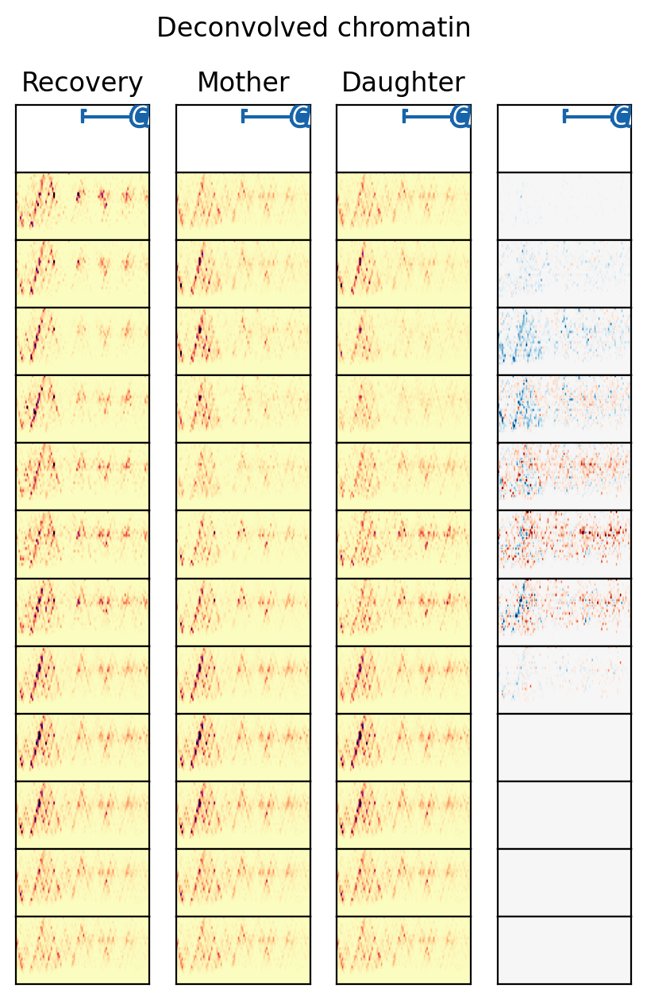

In [871]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='log',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.004
500/2600 - 00:00:06.048
1000/2600 - 00:00:53.656
1500/2600 - 00:01:48.111
2000/2600 - 00:02:48.088
2500/2600 - 00:03:43.406
Completed - 00:03:47.715


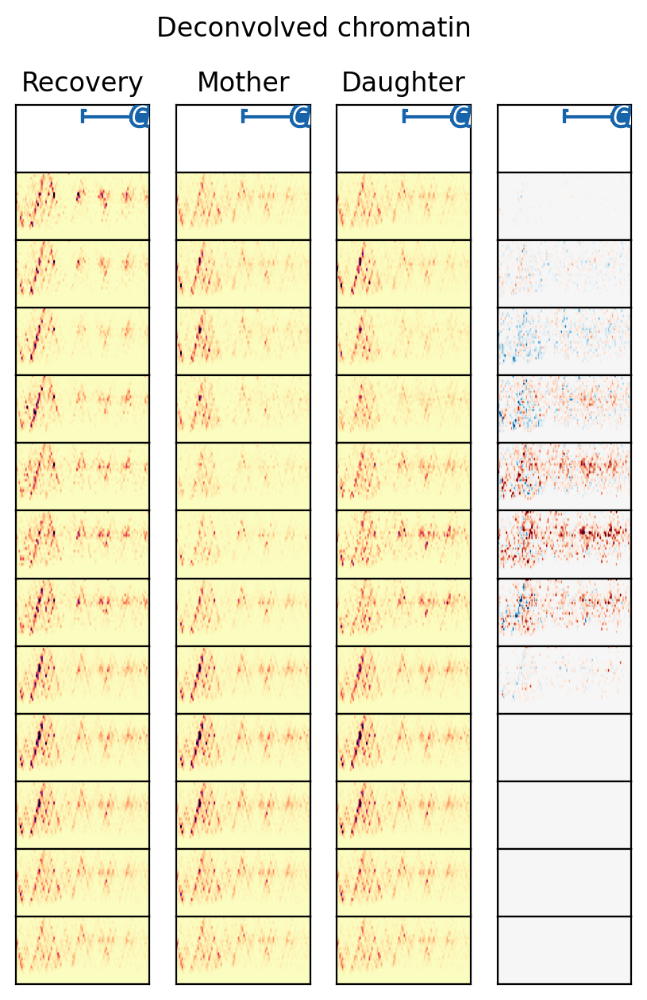

In [872]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='None',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.002
500/2600 - 00:00:07.735
1000/2600 - 00:01:05.862
1500/2600 - 00:02:01.006
2000/2600 - 00:02:57.092
2500/2600 - 00:03:50.172
Completed - 00:03:55.141


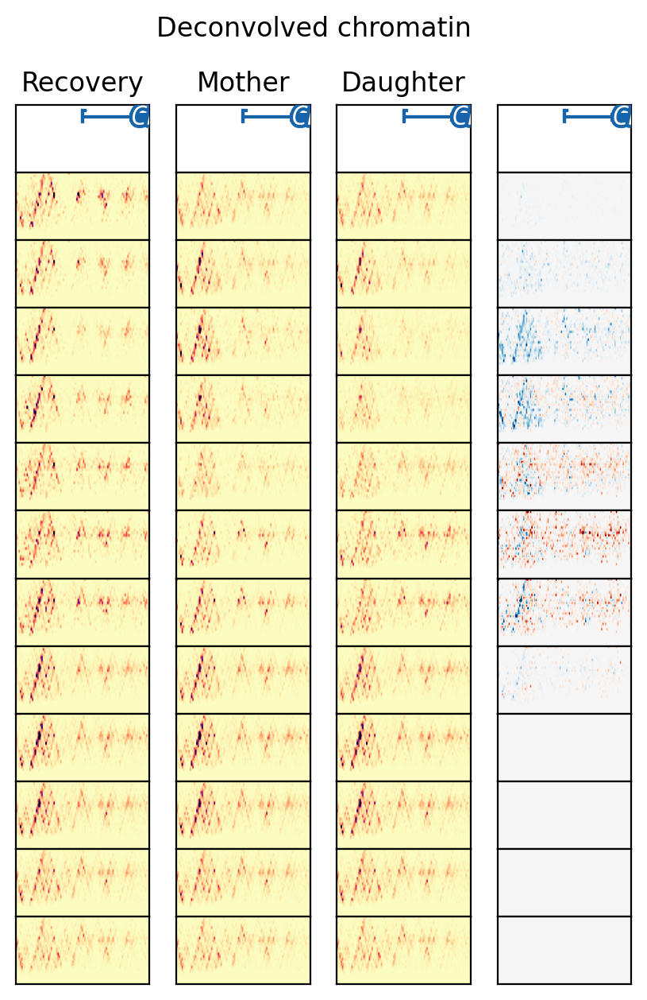

In [875]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='linear',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.002
500/2600 - 00:00:09.833
1000/2600 - 00:01:08.144
1500/2600 - 00:02:31.979
2000/2600 - 00:03:34.792
2500/2600 - 00:04:25.046
Completed - 00:04:29.322


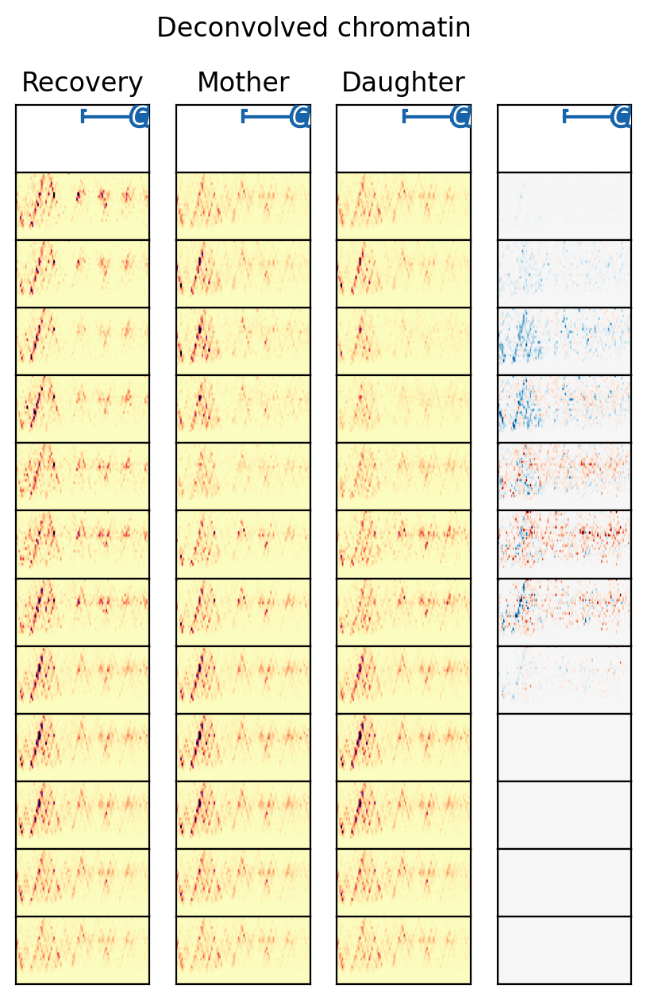

In [876]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='constant',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

In [877]:
chromatin_solver_hm = load_solver_gene('SSK22', subset=False, window=window)

Loading chromosome reads: 3
Applying a normalization for length distribution


0/2600 - 00:00:00.000
500/2600 - 00:00:08.231
1000/2600 - 00:00:52.681
1500/2600 - 00:01:41.008
2000/2600 - 00:02:32.812
2500/2600 - 00:03:18.979
Completed - 00:03:21.910


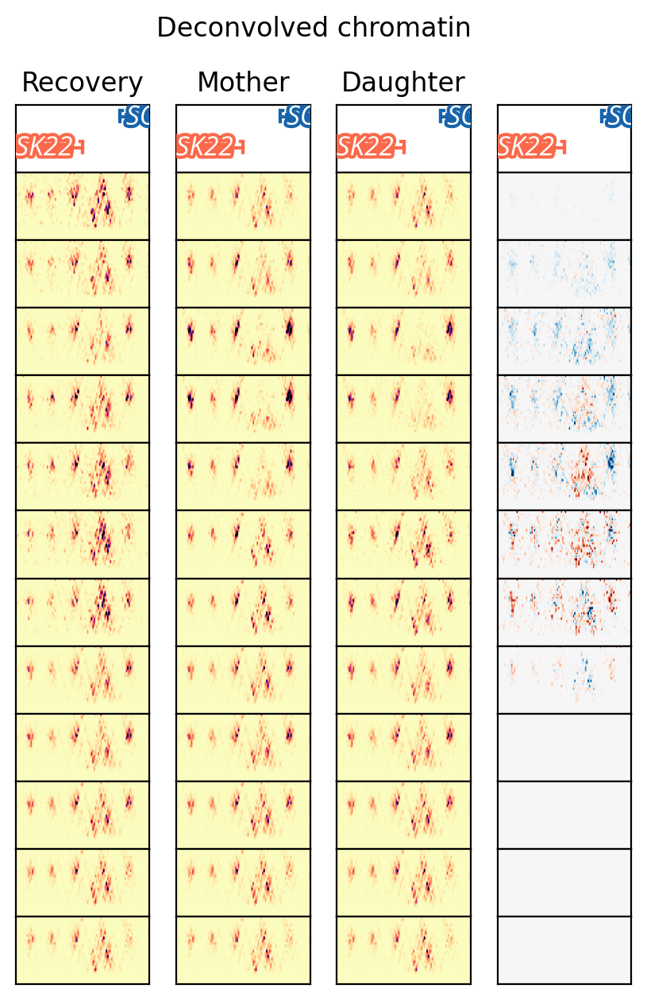

In [878]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='log',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.001
500/2600 - 00:00:09.135
1000/2600 - 00:00:56.358
1500/2600 - 00:01:48.015
2000/2600 - 00:02:41.659
2500/2600 - 00:03:29.538
Completed - 00:03:32.827


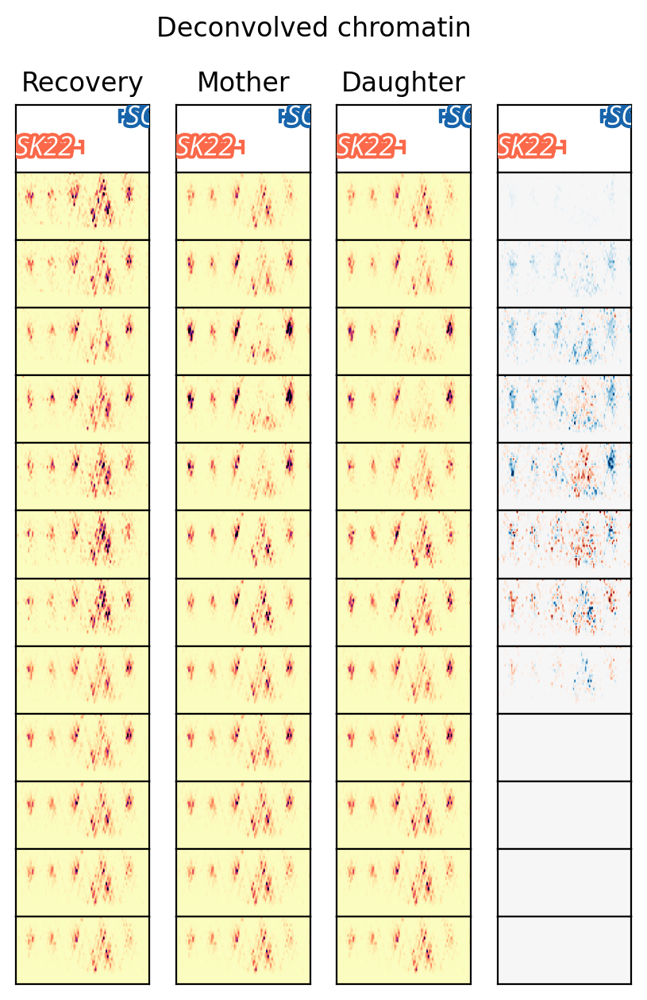

In [879]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='linear',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.002
500/2600 - 00:00:06.875
1000/2600 - 00:00:51.906
1500/2600 - 00:01:42.545
2000/2600 - 00:02:37.274
2500/2600 - 00:03:27.751
Completed - 00:03:31.080


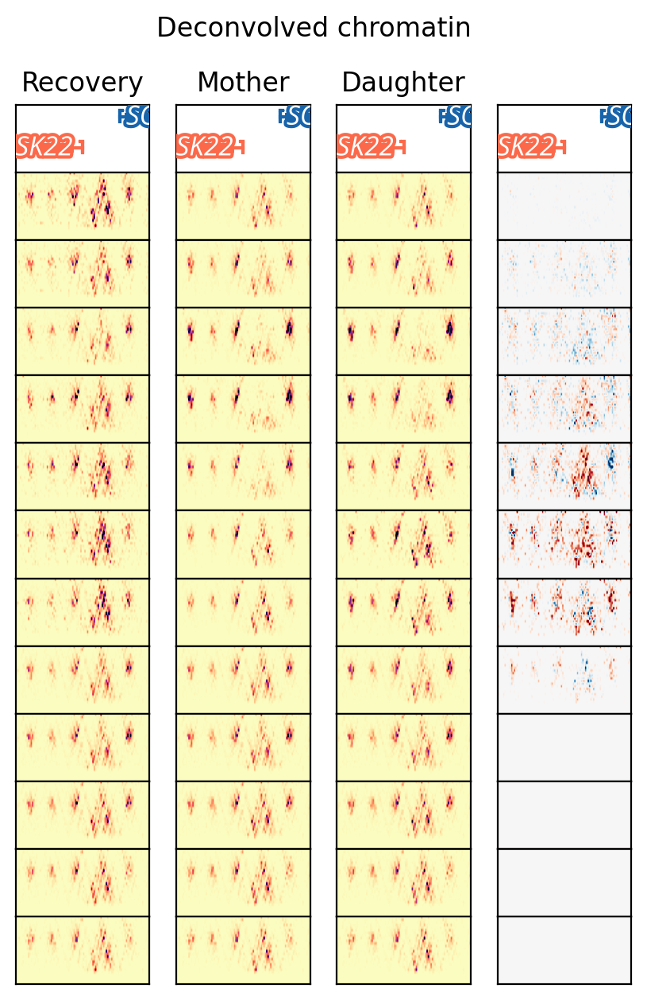

In [880]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='None',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)

0/2600 - 00:00:00.001
500/2600 - 00:00:08.334
1000/2600 - 00:00:56.919
1500/2600 - 00:01:49.122
2000/2600 - 00:02:41.508
2500/2600 - 00:03:31.833
Completed - 00:03:35.663


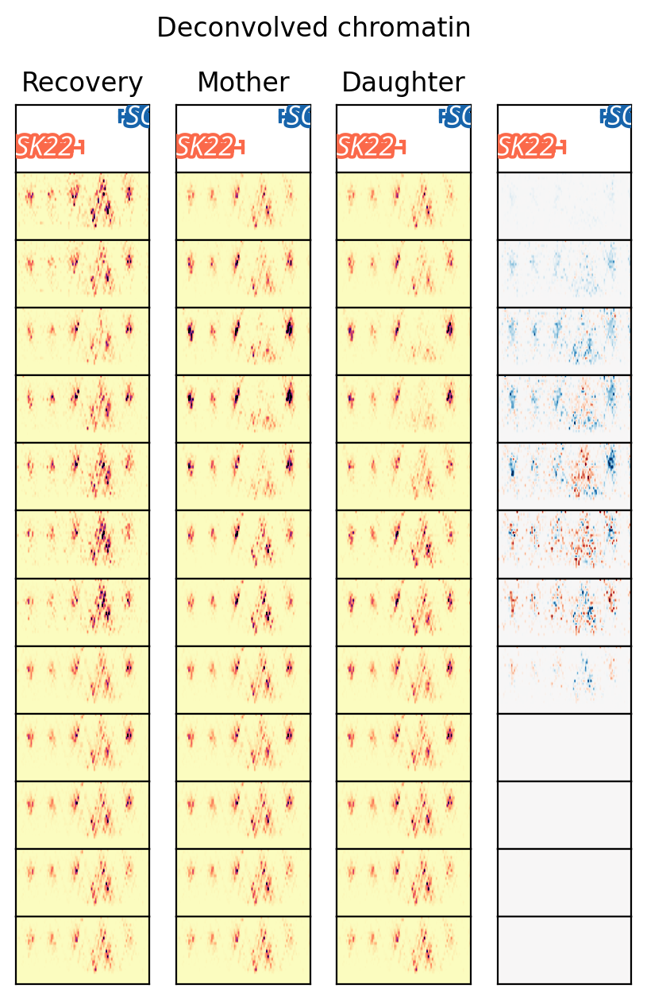

In [881]:
F_example = chromatin_solver_hm.deconvolve_G_iteratively(gamma=gamma, kappa=kappa,
                                                      dg1_bias_mode='constant',
                                                   verbose=True)
fig = plot_branches(config1, chromatin_solver_hm.chromatin_model.chr, 
    chromatin_solver_hm.chromatin_model.mnase_span, F_example)